In [1]:
# configurando...

from matplotlib import pyplot
from pandas import DataFrame
import numpy as np
import math as math
import time as time

n_amostras_treino = 3000
n_amostras_teste = 2000
colors = {'azul':'blue', 'laranja':'#FF7F0E'} # dict com cores para plotar
nomes_curvas = ["reta", "parabola", "circulo", "bumerangue", "moon"]

def plotar_classificação(nomes_curvas, dataframe):
    for curva in nomes_curvas:
        pyplot.figure(figsize=(5,5))
        for linha in range(len(dataframe.iloc[:, 0])):
            pyplot.scatter(x=dataframe['x'].iloc[linha], y=dataframe['y'].iloc[linha],
                           label = dataframe[curva].iloc[linha], color=colors[dataframe[curva].iloc[linha]])
        pyplot.title(curva, fontsize=25)
        pyplot.xlabel('x', fontsize=18)
        pyplot.ylabel('y', fontsize=18)
        pyplot.show()

def acurácia(nomes_curvas, dataframe1, dataframe2):
    for curva in nomes_curvas:
        acc = 0
        acc = round(sum(dataframe1[curva] == dataframe2[curva])/len(dataframe1[curva])*100, 3)
        print("acc = ", (acc), "% ", curva)

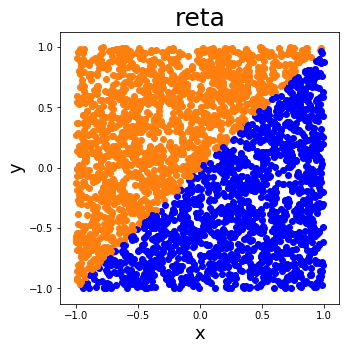

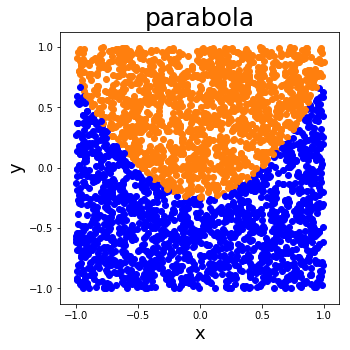

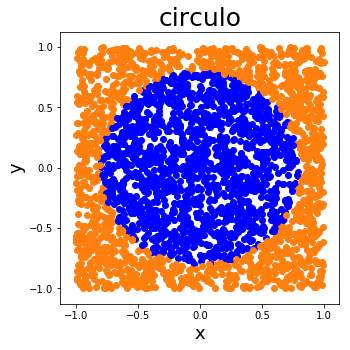

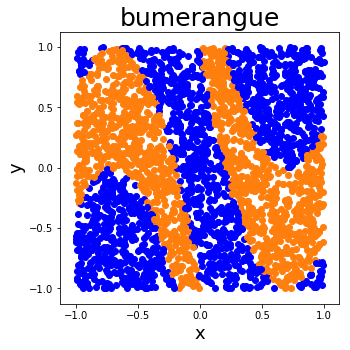

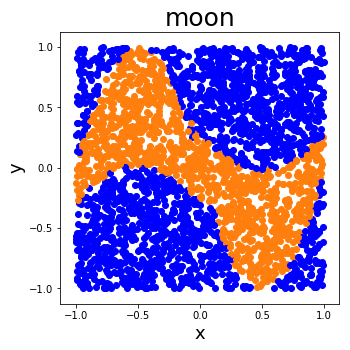

In [2]:
gerador = np.random.RandomState(1) #gerando número pseudo aleatórios de forma consistente
Xrand = gerador.random_sample(n_amostras_treino)*2-1 #random_sample gera números aleatórios entre 0 e 1, estou mudando a
Yrand = gerador.random_sample(n_amostras_treino)*2-1 # escala para entre -1 e 1

target_base_teste = []

for i in nomes_curvas:   # 0 reta, 1 parábola, 2 círculo, 3 moon, 4 bumerangue
    target_base_teste.append([])

for indice in range(len(Xrand)): #classificando cada par X[i],Y[i]
    x = Xrand[indice]
    y = Yrand[indice]
    if (y > x):
        target_base_teste[0].append('laranja')
    else:
        target_base_teste[0].append('azul')
    if (y > x**2-0.25):
        target_base_teste[1].append('laranja')
    else:
        target_base_teste[1].append('azul')
    if (x**2 + y**2 > ((2/math.pi)**(1/2))**2):  # círculo ocupa metade da área
        target_base_teste[2].append('laranja')
    else:
        target_base_teste[2].append('azul')
    if (y < -4*(x+0.2)*(x+1.2) and y > -4*(x+0.2)*(x+1.2)-1 or
        y > 4*(x-0.2)*(x-1.2) and y < 4*(x-0.2)*(x-1.2)+1):
        target_base_teste[3].append('laranja')
    else:
        target_base_teste[3].append('azul')
    if (y < -4*x*(x+1) and y>-1.2*(x+1.3)*(x-0.3)-0.75 or
        y > 4*(x*(x-1)) and y < 1.2*(x+0.3)*(x-1.3)+0.75):
        target_base_teste[4].append('laranja')
    else:
        target_base_teste[4].append('azul')
        
#transformando em DataFrame e plotando os pontos...
train_df = DataFrame(dict(x=Xrand, y=Yrand, reta=target_base_teste[0], parabola=target_base_teste[1],
                          circulo=target_base_teste[2], bumerangue=target_base_teste[3], moon=target_base_teste[4]))
del Xrand, Yrand, target_base_teste
    
plotar_classificação(nomes_curvas, train_df)

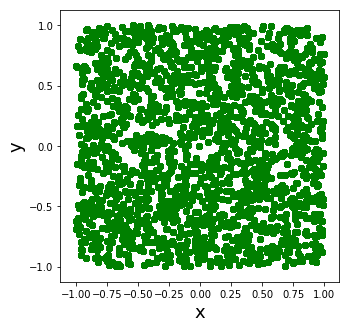

In [3]:
#criação e plot da base de testes sem predições
gerador = np.random.RandomState(3)

Xrand = gerador.random_sample(n_amostras_teste)*2-1
Yrand = gerador.random_sample(n_amostras_teste)*2-1
target_base_teste = []
for i in range(5):
    target_base_teste.append([])
for indice in range(len(Xrand)):
    x = Xrand[indice]
    y = Yrand[indice]
    if (y > x):
        target_base_teste[0].append('laranja')
    else:
        target_base_teste[0].append('azul')
    if (y > x**2-0.25):
        target_base_teste[1].append('laranja')
    else:
        target_base_teste[1].append('azul')
    if (x**2 + y**2 > ((2/math.pi)**(1/2))**2): 
        target_base_teste[2].append('laranja')
    else:
        target_base_teste[2].append('azul')
    if (y < -4*(x+0.2)*(x+1.2) and y > -4*(x+0.2)*(x+1.2)-1 or
        y > 4*(x-0.2)*(x-1.2) and y < 4*(x-0.2)*(x-1.2)+1):
        target_base_teste[3].append('laranja')
    else:
        target_base_teste[3].append('azul')
    if (y < -4*x*(x+1) and y>-1.2*(x+1.3)*(x-0.3)-0.75 or
        y > 4*(x*(x-1)) and y < 1.2*(x+0.3)*(x-1.3)+0.75):
        target_base_teste[4].append('laranja')
    else:
        target_base_teste[4].append('azul')
teste_df = DataFrame(dict(x=Xrand, y=Yrand, reta=target_base_teste[0], parabola=target_base_teste[1], circulo=target_base_teste[2],
                         bumerangue=target_base_teste[3], moon=target_base_teste[4]))
del target_base_teste
pyplot.figure(figsize=(5,5))

# mostrando a distribuição da base de testes
for indice in range(len(teste_df.iloc[:, 0])):
    pyplot.scatter(x=teste_df['x'], y=teste_df['y'], color='g')
    pyplot.xlabel('x', fontsize=18)
    pyplot.ylabel('y', fontsize=18)

In [4]:
#classificação com kNN para testar o LIME
from sklearn.neighbors import KNeighborsClassifier
knn = []  # lista dos classificadores utilizados
pred = [] # lista das classficações feitas pelos classificadores

for curva in nomes_curvas:
    classifier = KNeighborsClassifier(n_neighbors=15, metric='euclidean')
    knn.append(classifier.fit(train_df.loc[:, ['x', 'y']], train_df[curva]))
    pred.append(classifier.predict(teste_df.loc[:, ['x', 'y']]))
    
classificação_df = DataFrame(dict(x=Xrand, y=Yrand, reta=pred[0], parabola=pred[1], circulo=pred[2],
                         bumerangue=pred[3], moon=pred[4]))
del pred

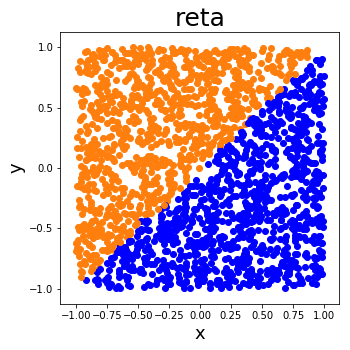

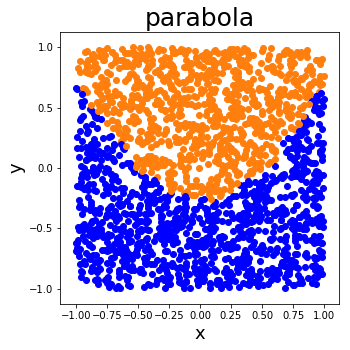

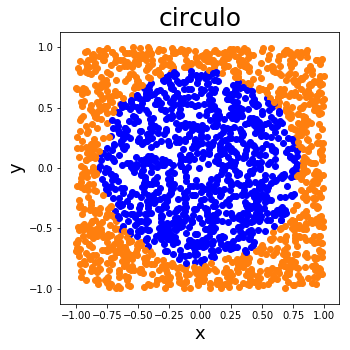

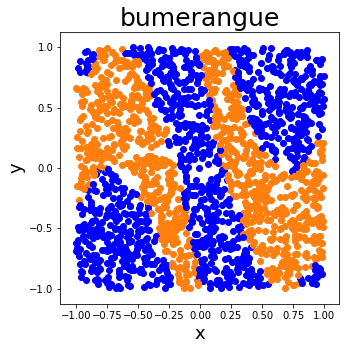

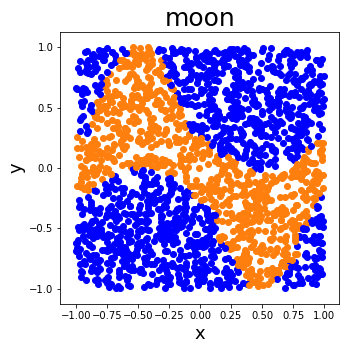

In [5]:
plotar_classificação(nomes_curvas, classificação_df)

In [6]:
acurácia(nomes_curvas, teste_df, classificação_df)

acc =  99.5 %  reta
acc =  98.85 %  parabola
acc =  98.2 %  circulo
acc =  97.7 %  bumerangue
acc =  97.55 %  moon


In [15]:
import lime.lime_tabular
explainer = lime.lime_tabular.LimeTabularExplainer(
                np.array(train_df.loc[:, ['x', 'y']]), mode='classification',
                feature_names = ['x', 'y'],
                class_names = ['azul', 'laranja'])

In [8]:
print("Moon:")
exp = explainer.explain_instance(np.array([-1, -1]), knn[3].predict_proba, num_samples=20000)
exp.show_in_notebook()
exp = explainer.explain_instance(np.array([-1, 1]), knn[3].predict_proba, num_samples=20000)
exp.show_in_notebook()
exp = explainer.explain_instance(np.array([0, 0]), knn[3].predict_proba, num_samples=20000)
exp.show_in_notebook()
exp = explainer.explain_instance(np.array([-.5, 0.5]), knn[3].predict_proba, num_samples=20000)
exp.show_in_notebook()

Moon:


#1 Variações na explicação e falta de indicar a incerteza

Como ele gera dados próximos ao ponto que se quer avaliar de forma aleatória, há variações em uma explicação feita diversas vezes


In [9]:
exp = explainer.explain_instance(np.array([-.9, 0.8]), knn[3].predict_proba, num_samples=20000)
exp.show_in_notebook()
exp = explainer.explain_instance(np.array([-.9, 0.8]), knn[3].predict_proba, num_samples=20000)
exp.show_in_notebook()
exp = explainer.explain_instance(np.array([-.9, 0.8]), knn[3].predict_proba, num_samples=20000)
exp.show_in_notebook()

A variação é maior caso o num_samples seja menor (num_samples é o número de perturbações que o lime gera para procurar uma explicação)

In [10]:
exp = explainer.explain_instance(np.array([-.9, 0.8]), knn[3].predict_proba, num_samples=2000)
exp.show_in_notebook()
exp = explainer.explain_instance(np.array([-.9, 0.8]), knn[3].predict_proba, num_samples=2000)
exp.show_in_notebook()
exp = explainer.explain_instance(np.array([-.9, 0.8]), knn[3].predict_proba, num_samples=2000)
exp.show_in_notebook()
exp = explainer.explain_instance(np.array([-.9, 0.8]), knn[3].predict_proba, num_samples=2000)
exp.show_in_notebook()

#2 Separação linear ou divisão em retângulos ?! 

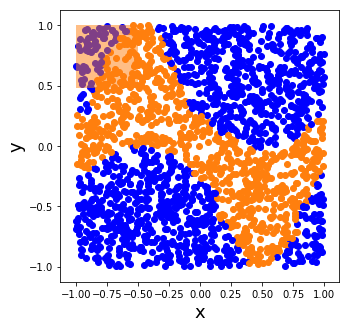

In [11]:
exp = explainer.explain_instance(np.array([-1, 1]), knn[3].predict_proba, num_samples=20000)
exp.show_in_notebook()
x_colorir = [np.arange(-1.0, -0.49, 0.01)]
fig, ax = pyplot.subplots(figsize=(5,5))
for linha in range(len(classificação_df['moon'])):
    pyplot.scatter(x=teste_df.iloc[linha]['x'], y=teste_df.iloc[linha]['y'],
                   label = classificação_df['moon'].iloc[linha], color=colors[classificação_df['moon'].iloc[linha]])
pyplot.xlabel('x', fontsize=18)
pyplot.ylabel('y', fontsize=18)

ax.fill_between(x_colorir[0], 0.48, 1, 
                facecolor='#FF7F0E', alpha=0.5)

pyplot.show()

In [16]:
import time
t1 = time.time()
fidelidade_lime = [0, 0, 0, 0, 0]
classificação_lime = []
for classific in range(len(nomes_curvas)):
    classificação_lime.append([])
    for indice in range(n_amostras_teste):
        exp = explainer.explain_instance(np.array([teste_df.iloc[indice]['x'], teste_df.iloc[indice]['y']]),
                                         knn[classific].predict_proba, num_samples=2000)
        if (exp.as_list()[0][1] + exp.as_list()[1][1]) > 0:
            classificação_lime[classific].append('laranja')
        else:
            classificação_lime[classific].append('azul')
    fidelidade_lime[classific] = sum(classificação_lime[classific] == classificação_df[nomes_curvas[classific]])/n_amostras_teste
t2 = time.time()
t2-t1

163.73435020446777

In [17]:
for i in range(len(nomes_curvas)):
    print("{0}: {1}% de fidelidade".format(nomes_curvas[i], round(100*fidelidade_lime[i], 4)))

reta: 87.5% de fidelidade
parabola: 88.75% de fidelidade
circulo: 75.45% de fidelidade
bumerangue: 71.4% de fidelidade
moon: 66.65% de fidelidade


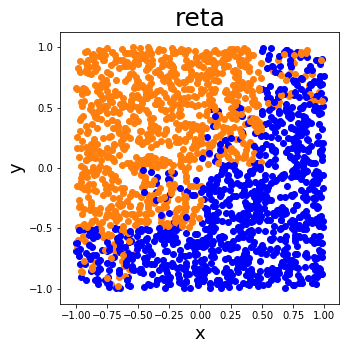

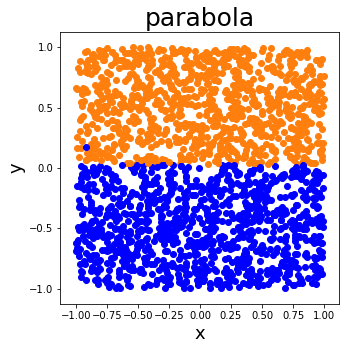

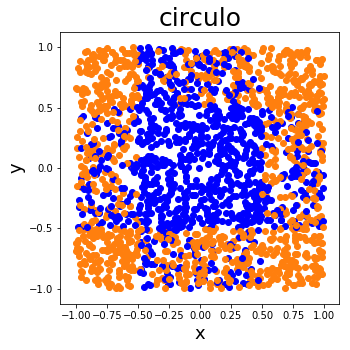

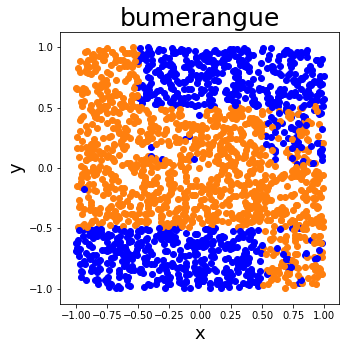

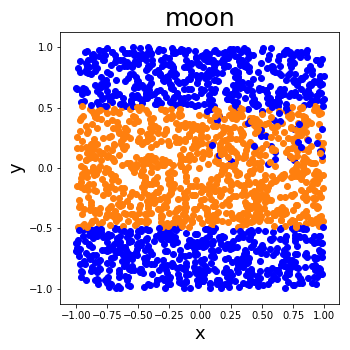

fidelidade =  87.5 %  reta
fidelidade =  88.75 %  parabola
fidelidade =  75.45 %  circulo
fidelidade =  71.4 %  bumerangue
fidelidade =  66.65 %  moon


In [18]:
classificação_lime_df = DataFrame(dict(zip(nomes_curvas, classificação_lime)))
classificação_lime_df['x'] = teste_df['x']
classificação_lime_df['y'] = teste_df['y']
plotar_classificação(nomes_curvas, classificação_lime_df)

for curva in nomes_curvas:
    acc = 0
    acc = round(sum(classificação_lime_df[curva] == classificação_df[curva])/len(classificação_lime_df[curva])*100, 3)
    print("fidelidade = ", (acc), "% ", curva)